<a href="https://colab.research.google.com/github/amedyukhina/biomassters/blob/main/biomassters_evaluate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%writefile requirements.txt

pandas==1.3.5
scikit-learn==1.0.2
tqdm==4.64.0
numpy==1.21.6
torch==1.12.1
torchvision==0.13.1
scikit-image==0.18.3
matplotlib==3.2.2
rasterio==1.2.0
boto3==1.26.16
pytorch_lightning
segmentation_models_pytorch

Writing requirements.txt


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 78 kB 7.6 MB/s 
     |████████████████████████████████| 776.3 MB 1.3 kB/s 
     |████████████████████████████████| 19.1 MB 11 kB/s 
     |████████████████████████████████| 19.1 MB 208 kB/s 
     |████████████████████████████████| 132 kB 73.3 MB/s 
     |████████████████████████████████| 800 kB 70.9 MB/s 
     |████████████████████████████████| 102 kB 15.4 MB/s 
     |████████████████████████████████| 10.3 MB 69.7 MB/s 
     |████████████████████████████████| 79 kB 11.2 MB/s 
     |████████████████████████████████| 140 kB 82.1 MB/s 
     |████████████████████████████████| 125 kB 66.1 MB/s 
     |████████████████████████████████| 512 kB 80.8 MB/s 
     |████████████████████████████████| 58 kB 8.8 MB/s 
     |████████████████████████████████| 376 kB 65.4 MB/s 
     |████████████████████████████████| 127 kB 68.5 MB/s 
  Created wheel for efficientnet-py

In [ ]:
from google.colab import drive
import os
import rasterio
import pandas as pd
from tqdm import tqdm
import numpy as np

import boto3
from botocore import UNSIGNED
from botocore.config import Config

from cachetools import cached, TTLCache

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
from torchvision.transforms import Compose, Normalize
import torch.nn.functional as F
import segmentation_models_pytorch as smp
import os
from torchvision.io import read_image
from torchvision import transforms
import rasterio
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint
import pytorch_lightning as pl
import warnings
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm
import shutil
from scipy import ndimage

# Our rasters contain no geolocation info, so silence this warning from rasterio
warnings.filterwarnings("ignore", category=rasterio.errors.NotGeoreferencedWarning)

In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
feature_path = 'gdrive/MyDrive/biomassters/info/features_metadata.csv'
train_img_dir = 'train_features'
test_img_dir = 'test_features'
label_dir = 'train_agbm'
output_dir = 'predicted'
model_checkpoint_path = 'gdrive/MyDrive/biomassters/models/'

In [ ]:
df = pd.read_csv(feature_path)

In [ ]:
df = df[df['split'] == 'train'].reset_index(drop=True)
all_ids = np.unique(df['chip_id'])
len(df), len(all_ids)

(189078, 8689)

In [ ]:
np.random.seed(42)
np.random.shuffle(all_ids)
train_ids = all_ids[:500]
val_ids = all_ids[500:550]

In [ ]:
BUCKET_NAME = 'drivendata-competition-biomassters-public-us'
os.environ["AWS_NO_SIGN_REQUEST"] = 'YES'
s3 = boto3.client('s3', config=Config(signature_version=UNSIGNED))

In [ ]:
cache = TTLCache(maxsize=1000, ttl=86400)

In [ ]:
@cached(cache)
def get_image(fn):
  obj = s3.get_object(Bucket=BUCKET_NAME, Key=fn)
  with rasterio.open(obj['Body']) as src:
    img = src.read()
  return img

In [ ]:
imgs = np.array([get_image(os.path.join(train_img_dir, 
                                        rf"{chip_id}_S2_10.tif"))[:10].astype(np.float32)
for chip_id in tqdm(train_ids)])

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
MEANS = np.array([imgs[:,i].mean() for i in range(imgs.shape[1])])
STDS = np.array([imgs[j,i].std() for j in range(imgs.shape[0]) 
  for i in range(imgs.shape[1])]).reshape((imgs.shape[:2])).mean(0)
MEANS, STDS

(array([ 351.17044,  510.9589 ,  402.16486,  806.2029 , 1867.5754 ,
        2176.718  , 2291.1814 , 2369.1711 , 1289.4501 ,  712.62384],
       dtype=float32),
 array([334.35522, 358.21567, 373.20316, 454.30496, 748.4975 , 860.6772 ,
        927.9587 , 909.60693, 590.44324, 439.3085 ], dtype=float32))

In [ ]:
class SentinelDataset2(Dataset):
    def __init__(self, chip_ids, img_dir, label_dir=None, 
                 transform=None):
        self.chip_ids = chip_ids
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        
    def __len__(self):
        return len(self.chip_ids)

    def __getitem__(self, idx):
        image = get_image(os.path.join(self.img_dir, 
                                       rf"{self.chip_ids[idx]}_S2_10.tif"))
        image = torch.tensor(image.astype(np.float32)[:10])
        image = (image - 
                 torch.tensor(MEANS).unsqueeze(1).unsqueeze(1))/torch.tensor(STDS).unsqueeze(1).unsqueeze(1)
        
        if self.label_dir is not None:
            label = get_image(os.path.join(self.label_dir, 
                                           rf"{self.chip_ids[idx]}_agbm.tif"))
            label = ndimage.median_filter(label[0], 3)
            label = torch.tensor(label.astype(np.float32)).unsqueeze(0)
        else:
            label = None

        
        if self.transform:
            image = self.transform(torch.concat([image, label]))
            label = image[-1:]
            image = image[:-1]
            
        return image, label

In [ ]:
val_ds = SentinelDataset2(val_ids, train_img_dir, label_dir)
valid_dataloader = DataLoader(val_ds, batch_size=1, 
                              shuffle=False, num_workers = 2)

In [ ]:
class Sentinel2Model(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self.model(x)
        loss = F.mse_loss(y_hat, y)
        self.log("train/loss", loss)
        self.log("train/rmse", torch.sqrt(loss))
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self.model(x)
        loss = F.mse_loss(y_hat, y)
        self.log("valid_loss", loss)
        self.log("valid_rmse", torch.sqrt(loss))
        return loss
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.02)
    
    def forward(self, x):
        return self.model(x)

In [ ]:
base_model = smp.Unet(
    encoder_name="resnet50",       
    in_channels=10,                 
    classes=1,                     
)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [ ]:
s2_model = Sentinel2Model(base_model)

In [ ]:
models = os.listdir(model_checkpoint_path)
models

['silver-bird-7', 'likely-cosmos-8']

In [ ]:
ind = 0

In [ ]:
fn = os.listdir(os.path.join(model_checkpoint_path, models[ind]))[0]
fn

'epoch=18-valid_rmse=44.93.ckpt'

In [ ]:
s2_model.load_state_dict(torch.load(os.path.join(model_checkpoint_path, models[ind], fn))['state_dict'])
s2_model.eval().cuda();

In [ ]:
imgs, labels = next(iter(valid_dataloader))
pred = s2_model(imgs.cuda())

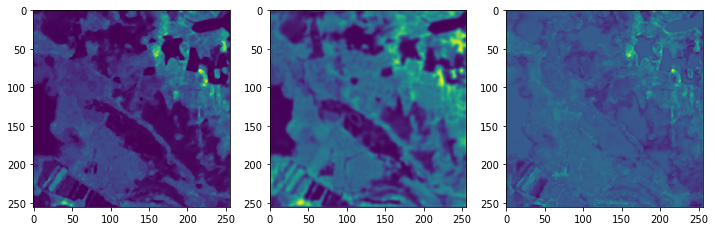

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(ndimage.median_filter(labels[0].numpy()[0], 3))
axes[1].imshow(pred[0].cpu().detach().numpy()[0])
axes[2].imshow(ndimage.median_filter(labels[0].numpy()[0], 3) - pred[0].cpu().detach().numpy()[0])

In [ ]:
rmse = []
all_images = []
all_labels = []
all_preds = []
for imgs, labels in tqdm(valid_dataloader):
    pred = s2_model(imgs.cuda())
    loss = F.mse_loss(labels.cuda(), pred)
    rmse.append(torch.sqrt(loss).item())
    all_images.append(imgs.cpu().detach().numpy()[0])
    all_labels.append(labels.cpu().detach().numpy()[0][0])
    all_preds.append(pred.cpu().detach().numpy()[0][0])

  0%|          | 0/50 [00:00<?, ?it/s]

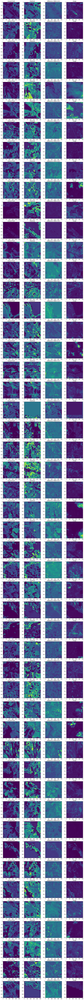

In [85]:
s = 4
rows = len(rmse)

fig, axes = plt.subplots(rows, 4, figsize=(4*s, rows*s))
for i in range(rows):
  plt.sca(axes[i, 0])
  plt.imshow(all_labels[i])
  plt.title('Ground Truth')

  plt.sca(axes[i, 1])
  plt.imshow(all_preds[i])
  plt.title('Predicted')

  plt.sca(axes[i, 2])
  plt.imshow(all_labels[i] - all_preds[i])
  plt.title(rf'Difference. RMSE={round(rmse[i], 1)}')

  plt.sca(axes[i, 3])
  plt.imshow(all_images[i][0])
  plt.title('Image')